In [1]:
# Prettyfy this
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold, validation_curve, GridSearchCV
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score, precision_score, plot_confusion_matrix
from sklearn.inspection import permutation_importance
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image
from xgboost import XGBClassifier
import lightgbm as lgb
import imblearn
from imblearn.over_sampling import RandomOverSampler
from sklearn.inspection import partial_dependence, plot_partial_dependence, PartialDependenceDisplay
from shap import TreeExplainer, summary_plot
from pdpbox import pdp, get_dataset, info_plots
from pycebox.ice import ice, ice_plot
#import alibi
import lime
import lime.lime_tabular
import shap

In [2]:
# Dataset already encoded and split

train = pd.read_csv('Data/application_data_train.csv')
valid = pd.read_csv('Data/application_data_valid.csv')
test = pd.read_csv('Data/application_data_test.csv')

In [4]:
def prepare_for_RF(data):
    
  
  # Remove outliers - 4422 out of 215257
  ids_to_remove = train[(np.abs(stats.zscore(train[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'AMT_GOODS_PRICE']])) >= 3)].SK_ID_CURR.unique()
  data = data[~data.SK_ID_CURR.isin(ids_to_remove)]
    

  # Remove features with correlation above 0.95

  columns_to_remove = ['NAME_CONTRACT_TYPE_Cash loans', 'FLAG_OWN_CAR_N', 'FLAG_OWN_REALTY_N', 'CODE_GENDER_F', 'ORGANIZATION_TYPE_XNA', 'FLAG_EMP_PHONE', 'NAME_INCOME_TYPE_Pensioner', 'OBS_60_CNT_SOCIAL_CIRCLE', 'YEARS_BUILD_MEDI', 'FLOORSMIN_MEDI', 'FLOORSMAX_MEDI', 'ENTRANCES_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'LIVINGAREA_MEDI', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'LANDAREA_AVG', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_MODE', 'FLOORSMAX_MEDI', 'FLOORSMIN_MODE', 'FLOORSMAX_MODE', 'AMT_GOODS_PRICE', 'ELEVATORS_MEDI', 'LANDAREA_MEDI', 'COMMONAREA_MEDI', 'ENTRANCES_MODE', 'ENTRANCES_MEDI', 'ELEVATORS_MODE', 'COMMONAREA_MODE', 'ENTRANCES_MODE', 'NONLIVINGAPARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'APARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'LANDAREA_MODE', 'NONLIVINGAREA_MEDI', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'LIVINGAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'REGION_RATING_CLIENT_W_CITY']
  data = data.drop(columns_to_remove, axis = 1)
    
  # Fill NaN

  data = data.fillna(data.mean())
    
  # Drop ID

  data = data.drop('SK_ID_CURR', axis = 1)
    
  # Light GBM change of names

  data.columns = data.columns.str.replace("[^A-Za-z0-9_]+", "")

  return data

In [5]:
rf_df_train = prepare_for_RF(train)
rf_df_valid = prepare_for_RF(valid)
rf_df_test = prepare_for_RF(test)

In [6]:
rf_df_train.append(rf_df_valid).append(rf_df_test).shape

(303089, 206)

In [14]:
rf_df_train.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,HOUSETYPE_MODE_terracedhouse,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,WALLSMATERIAL_MODE_Stonebrick,WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,1,0,117000.0,417024.0,20191.5,0.020246,-21774,-2125,-4611.0,-4653,...,0,0,0,0,0,0,0,0,0,0
1,0,0,450000.0,640080.0,31261.5,0.046220,-18499,-2055,-3052.0,-2028,...,0,0,0,0,0,1,0,0,1,0
2,0,0,450000.0,900000.0,45000.0,0.010643,-18084,-4159,-8525.0,-1616,...,0,0,0,0,0,1,0,0,1,0
3,0,1,360000.0,1125000.0,33025.5,0.018634,-12319,-2532,-12304.0,-4215,...,0,0,0,0,0,0,0,0,0,0
5,0,2,112500.0,455040.0,12510.0,0.018634,-20176,-878,-4818.0,-3266,...,0,0,0,0,0,0,0,0,0,0


In [22]:
y_train = rf_df_train.TARGET
X_train = rf_df_train.drop('TARGET', axis = 1)

y_valid = rf_df_valid.TARGET
X_valid = rf_df_valid.drop('TARGET', axis = 1)

y_test = rf_df_test.TARGET
X_test = rf_df_test.drop('TARGET', axis = 1)

### Preprocessing

In [7]:
scoring = {'accuracy': 'accuracy','precision': 'precision', 'AUC': 'roc_auc'}

### XGBoost with Original Data

In [26]:
# Initialize Model with 20,000 samples

xgb_model = XGBClassifier(learning_rate=0.01, max_depth=5, n_estimators=100)
kfold = StratifiedKFold(n_splits=3, shuffle=True)
xgb_model.fit(X_train.iloc[:20000,:], y_train[:20000]) # which loss am I using here?
results_xgb = cross_validate(xgb_model, X_train.iloc[:20000,:], y_train[:20000], cv=kfold, scoring = scoring)

[15:15:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[15:15:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[15:15:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[15:15:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [28]:
results_xgb

{'fit_time': array([5.01868677, 4.86022568, 5.28369689]),
 'score_time': array([0.19096375, 0.14180994, 0.15183282]),
 'test_accuracy': array([0.91960402, 0.91930403, 0.91854185]),
 'test_precision': array([0.33333333, 0.16666667, 0.36111111]),
 'test_AUC': array([0.72353804, 0.730867  , 0.69971801])}

In [35]:
print('accuracy: Mean = ' + str(results_xgb['test_accuracy'].mean()) + ' Std = ' + str(results_xgb['test_accuracy'].std()))
print('precision: Mean = ' + str(results_xgb['test_precision'].mean()) + ' Std = ' + str(results_xgb['test_precision'].std()))
print('AUC: Mean = ' + str(results_xgb['test_AUC'].mean()) + ' Std = ' + str(results_xgb['test_AUC'].std()))

accuracy: Mean = 0.9191499695942297 Std = 0.00044710253335133944
precision: Mean = 0.28703703703703703 Std = 0.08586683792125652
AUC: Mean = 0.7180410157594962 Std = 0.013297314596770426


### LightGBM with Original Data

In [48]:
# Initialize model with 20,000 samples - Dont need to be 20,000 here
lgbm_model = lgb.LGBMClassifier(learning_rate=0.01,max_depth=5, n_estimators = 100)
lgbm_model.fit(X_train.iloc[:20000,:], y_train[:20000])
lgbm_model.fit(X_train,y_train, eval_metric='binary')
kfold = StratifiedKFold(n_splits=3, shuffle=True)
results_lgbm = cross_validate(lgbm_model, X_train.iloc[:20000,:], y_train[:20000], cv=kfold, scoring = scoring)

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [51]:
print('accuracy: Mean = ' + str(results_lgbm['test_accuracy'].mean()) + ' Std = ' + str(results_lgbm['test_accuracy'].std()))
print('precision: Mean = ' + str(results_lgbm['test_precision'].mean()) + ' Std = ' + str(results_lgbm['test_precision'].std()))
print('AUC: Mean = ' + str(results_lgbm['test_AUC'].mean()) + ' Std = ' + str(results_lgbm['test_AUC'].std()))

accuracy: Mean = 0.91995000459998 Std = 6.505354133760537e-05
precision: Mean = 0.0 Std = 0.0
AUC: Mean = 0.7214774074192861 Std = 0.0048222491717737825


### Oversampling

In [ ]:
# Oversampling improves AUC to ~0.80. Still can try custom loss function and SMOTE

In [19]:
# Oversample
oversample = RandomOverSampler(sampling_strategy=0.5)
X_over, y_over = oversample.fit_resample(X, y)

# Split Dataset

X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X_over, y_over, random_state=1)
X_train_o, X_valid_o, y_train_o, y_valid_o = train_test_split(X_train_o, y_train_o, random_state=1)

In [88]:
# Train Model
lgbm_model = lgb.LGBMClassifier(max_depth=5, n_estimators = 100)
kfold = StratifiedKFold(n_splits=3, shuffle=True)
results_lgbm = cross_validate(lgbm_model, X_train_o, y_train_o, cv=kfold, scoring = scoring)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [167]:
# Finding optimal oversampling ratio

oversampled_accuracy = {}
oversampled_auc = {}
original_accuracy = {}
original_auc = {}

for ratio in range(88, 110, 1):
    
    # Oversample
    oversample = RandomOverSampler(sampling_strategy= ratio/1000)
    X_over, y_over = oversample.fit_resample(X, y)

    # Split Dataset

    X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X_over, y_over, random_state=1)
    X_train_o, X_valid_o, y_train_o, y_valid_o = train_test_split(X_train_o, y_train_o, random_state=1)
    
    # Train Model
    
    lgbm_model = lgb.LGBMClassifier(max_depth=5, n_estimators = 500)
    kfold = StratifiedKFold(n_splits=3, shuffle=True)
    results_lgbm = cross_validate(lgbm_model, X_train_o, y_train_o, cv=kfold, scoring = scoring)
    
    # Fit model with oversampled data
    
    lgbm_model.fit(X_train_o,y_train_o, eval_metric='binary')
    
    
    # Store values
    y_hat = lgbm_model.predict(X_valid_o)
    oversampled_accuracy[ratio/100] = accuracy_score(y_hat, y_valid_o)
    oversampled_auc[ratio/100] = roc_auc_score(y_hat, y_valid_o)
    
    y_hat = lgbm_model.predict(X_valid)
    original_accuracy[ratio/100] = accuracy_score(y_hat, y_valid)
    original_auc[ratio/100] = roc_auc_score(y_hat, y_valid)
    

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

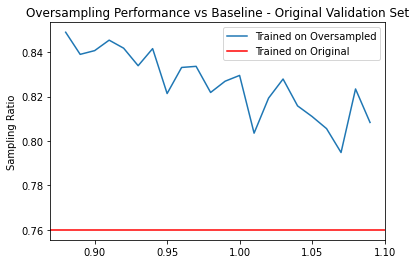

In [173]:
#AUC as imbalance decreases - oversampling doesnt seem to solve the problem

#plt.plot(oversampled_accuracy, label = 'oversampled_accuracy')
#plt.plot(oversampled_auc.keys(), oversampled_auc.values(), label = 'oversampled_auc')
#plt.plot(original_accuracy, label = 'original_accuracy')
plt.plot(original_auc.keys(),original_auc.values(), label = 'Trained on Oversampled')
plt.axhline(y=0.76, color='r', linestyle='-', label = 'Trained on Original')
plt.ylabel('Sampling Ratio')
plt.title('Oversampling Performance vs Baseline - Original Validation Set')
#plt.plot(original_auc, label = 'original_auc')
plt.legend()
plt.show()

In [162]:
results_lgbm = cross_validate(lgbm_model, X_train, y_train, cv=kfold, scoring = scoring)
    
# Fit model with oversampled data
    
lgbm_model.fit(X_train_o,y_train_o, eval_metric='binary')
    
    
y_hat = lgbm_model.predict(X_valid)
accuracy_score(y_hat, y_valid)
roc_auc_score(y_hat, y_valid)
    

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


0.7628317135463994

In [55]:
# Evaluating on oversampled and original train set

lgbm_model.fit(X_train_o,y_train_o, eval_metric='binary')

# Oversampled
y_hat = lgbm_model.predict(X_valid_o)
print('Oversampled')
print('Accuracy: ' + str(accuracy_score(y_hat, y_valid_o)))
print('AUC: ' + str(roc_auc_score(y_hat, y_valid_o)))

#Original
y_hat = lgbm_model.predict(X_valid)
print('Original')
print('Accuracy: ' + str(accuracy_score(y_hat, y_valid)))
print('AUC: ' + str(roc_auc_score(y_hat, y_valid)))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Oversampled
Accuracy: 0.914651002073255
AUC: 0.73378333200597
Original
Accuracy: 0.9215387016771016
AUC: 0.7850999467782843


In [68]:
# Evaluating on oversampled and original train set

lgbm_model.fit(X_train,y_train, eval_metric='binary')

# Oversampled
y_hat = lgbm_model.predict(X_valid_o)
print('Oversampled')
print('Accuracy: ' + str(accuracy_score(y_hat, y_valid_o)))
print('AUC: ' + str(roc_auc_score(y_hat, y_valid_o)))

#Original
y_hat = lgbm_model.predict(X_valid)
print('Original')
print('Accuracy: ' + str(accuracy_score(y_hat, y_valid)))
print('AUC: ' + str(roc_auc_score(y_hat, y_valid)))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Oversampled
Accuracy: 0.9053933966778317
AUC: 0.8149907931371211
Original
Accuracy: 0.9211918347525971
AUC: 0.7363993809572481


In [ ]:
X

In [23]:
rf_df_train

# Optimal Oversampling

oversample = RandomOverSampler(sampling_strategy= 0.099)
X_over, y_over = oversample.fit_resample(X_train, y_train)

# Split Dataset

X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X_over, y_over, random_state=1)
X_train_o, X_valid_o, y_train_o, y_valid_o = train_test_split(X_train_o, y_train_o, random_state=1)

### Models

In [117]:
kfold = StratifiedKFold(n_splits=3, shuffle=True)

#### Random Forest

In [150]:
rf_model = RandomForestClassifier(max_depth = 5, n_estimators = 500)
results_rf = cross_validate(rf_model, X_train_o, y_train_o, cv=kfold, scoring = scoring)

In [127]:
print('accuracy: Mean = ' + str(results_rf['test_accuracy'].mean()) + ' Std = ' + str(results_rf['test_accuracy'].std()))
print('precision: Mean = ' + str(results_rf['test_precision'].mean()) + ' Std = ' + str(results_rf['test_precision'].std()))
print('AUC: Mean = ' + str(results_rf['test_AUC'].mean()) + ' Std = ' + str(results_rf['test_AUC'].std()))

accuracy: Mean = 0.909603323626684 Std = 7.361178801009895e-06
precision: Mean = 0.0 Std = 0.0
AUC: Mean = 0.725716652391719 Std = 0.0032691194482238825


In [151]:
rf_model.fit(X_train_o, y_train_o)
rf_model.predict(X_train_o).sum()

0

#### XGBoost

In [148]:
xgb_model = XGBClassifier(learning_rate=0.01, max_depth=5, n_estimators=500)
results_xgb = cross_validate(xgb_model, X_train_o, y_train_o, cv=kfold, scoring = scoring)

In [119]:
print('accuracy: Mean = ' + str(results_xgb['test_accuracy'].mean()) + ' Std = ' + str(results_xgb['test_accuracy'].std()))
print('precision: Mean = ' + str(results_xgb['test_precision'].mean()) + ' Std = ' + str(results_xgb['test_precision'].std()))
print('AUC: Mean = ' + str(results_xgb['test_AUC'].mean()) + ' Std = ' + str(results_xgb['test_AUC'].std()))

accuracy: Mean = 0.909609046087342 Std = 1.5453960273801142e-05
precision: Mean = 0.35714285714285715 Std = 0.25421614885788835
AUC: Mean = 0.7366081230850852 Std = 0.0015085103745611907


In [149]:
xgb_model.fit(X_train_o, y_train_o)
xgb_model.predict(X_train_o).sum()

[20:45:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


118

#### Light GBM

In [145]:
lgbm_model = lgb.LGBMClassifier(learning_rate=0.01, max_depth=5, n_estimators = 500)
results_lgbm = cross_validate(lgbm_model, X_train_o, y_train_o, cv=kfold, scoring = scoring)

In [122]:
print('accuracy: Mean = ' + str(results_lgbm['test_accuracy'].mean()) + ' Std = ' + str(results_lgbm['test_accuracy'].std()))
print('precision: Mean = ' + str(results_lgbm['test_precision'].mean()) + ' Std = ' + str(results_lgbm['test_precision'].std()))
print('AUC: Mean = ' + str(results_lgbm['test_AUC'].mean()) + ' Std = ' + str(results_lgbm['test_AUC'].std()))

accuracy: Mean = 0.9095976013625018 Std = 4.8194354588919994e-05
precision: Mean = 0.6185185185185186 Std = 0.28922108156080945
AUC: Mean = 0.7457034816507139 Std = 0.0019016504766767293


In [146]:
lgbm_model.fit(X_train_o, y_train_o)
lgbm_model.predict(X_train_o).sum()

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


198

#### Model Comparison

In [132]:
# Final plot putting it all together

num_est = [50,100,150, 200]

train_score_rf, test_score_rf = validation_curve(
                                rf_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'n_estimators', 
                                scoring = 'roc_auc', 
                                param_range = num_est, cv = 2)

train_score_xgb, test_score_xgb = validation_curve(
                                xgb_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'n_estimators', 
                                scoring = 'roc_auc', 
                                param_range = num_est, cv = 2)

train_score_lgbm, test_score_lgbm = validation_curve(
                                lgbm_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'n_estimators', 
                                scoring = 'roc_auc', 
                                param_range = num_est, cv = 2)

[20:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [138]:
test_score_rf = test_score_rf.mean(axis = 1)
test_score_xgb = test_score_xgb.mean(axis = 1)
test_score_lgbm = test_score_lgbm.mean(axis = 1)

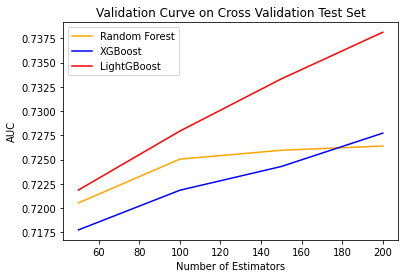

In [139]:
plt.title("Validation Curve on Cross Validation Test Set")
plt.xlabel("Number of Estimators")
plt.ylabel("AUC")
#plt.ylim(0.8, 1.0)
#lw = 2

plt.plot(
    num_est, test_score_rf, label="Random Forest", color="orange"
)
plt.plot(
    num_est, test_score_xgb, label="XGBoost", color="blue"
)
plt.plot(
    num_est, test_score_lgbm, label="LightGBoost", color="red"
)
plt.legend(loc="best")
plt.show()

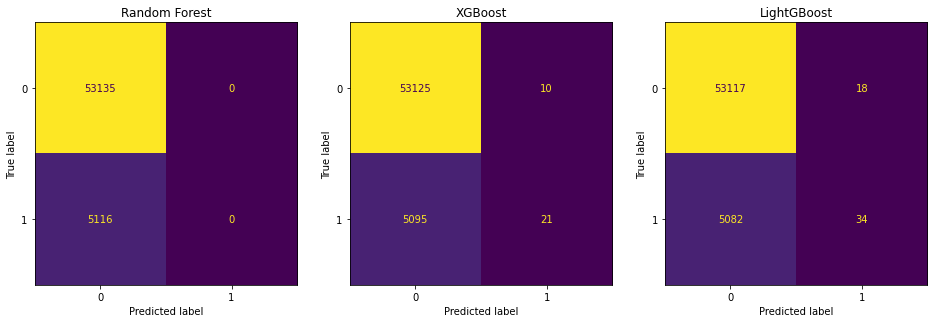

In [157]:
fig = plt.figure(figsize=(16, 12))

ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

ax1.set_title('Random Forest')
ax2.set_title('XGBoost')
ax3.set_title('LightGBoost')

plot_confusion_matrix(rf_model, X_valid_o, y_valid_o, ax = ax1, colorbar = False) 
plot_confusion_matrix(xgb_model, X_valid_o, y_valid_o, ax = ax2, colorbar = False) 
plot_confusion_matrix(lgbm_model, X_valid_o, y_valid_o, ax = ax3, colorbar = False) 



### Hyperparameter Optimization

In [10]:
# Number of trees

lgbm_model = lgb.LGBMClassifier(learning_rate=0.01, max_depth=5)

num_est = [50,100,150,200,250,300, 350, 400, 450, 500, 550, 600, 650, 700]
train_score, test_score = validation_curve(
                                lgbm_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'n_estimators', 
                                scoring = 'roc_auc', 
                                param_range = num_est, cv = 3)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [15]:
train_score = train_score.mean(axis = 1)
test_score = test_score.mean(axis = 1)

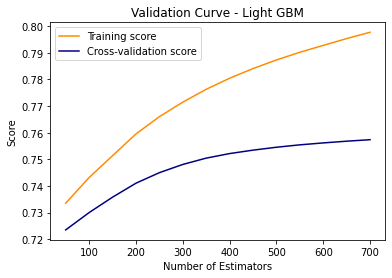

In [16]:
plt.title("Validation Curve - Light GBM")
plt.xlabel("Number of Estimators")
plt.ylabel("AUC")
#plt.ylim(0.8, 1.0)
lw = 2

plt.plot(
    num_est, train_score, label="Training score", color="darkorange"
)

plt.plot(
    num_est, test_score, label="Cross-validation score", color="navy"
)
plt.legend(loc="best")
plt.show()

In [24]:
# Tree Depth

lgbm_model = lgb.LGBMClassifier(learning_rate=0.01, n_estimators = 700)

tree_depth = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
train_score, test_score = validation_curve(
                                lgbm_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'max_depth', 
                                scoring = 'roc_auc', 
                                param_range = tree_depth, cv = 3)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [25]:
train_score = train_score.mean(axis = 1)
test_score = test_score.mean(axis = 1)

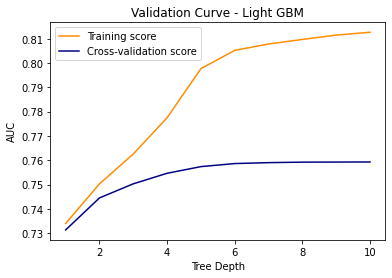

In [26]:
plt.title("Validation Curve - Light GBM")
plt.xlabel("Tree Depth")
plt.ylabel("AUC")
#plt.ylim(0.8, 1.0)
lw = 2

plt.plot(
    tree_depth, train_score, label="Training score", color="darkorange"
)

plt.plot(
    tree_depth, test_score, label="Cross-validation score", color="navy"
)
plt.legend(loc="best")
plt.show()

In [27]:
# Learning Rate

lgbm_model = lgb.LGBMClassifier(max_depth = 6, n_estimators = 700)

rates = [0.01, 0.02, 0.03, 0.04, 0.05]
train_score, test_score = validation_curve(
                                lgbm_model,
                                X = X_train_o, y = y_train_o, 
                                param_name = 'learning_rate', 
                                scoring = 'roc_auc', 
                                param_range = rates, cv = 3)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [28]:
train_score = train_score.mean(axis = 1)
test_score = test_score.mean(axis = 1)

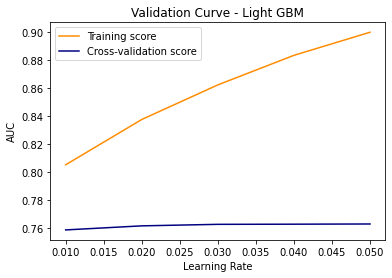

In [29]:
plt.title("Validation Curve - Light GBM")
plt.xlabel("Learning Rate")
plt.ylabel("AUC")
#plt.ylim(0.8, 1.0)
lw = 2

plt.plot(
    rates, train_score, label="Training score", color="darkorange"
)

plt.plot(
    rates, test_score, label="Cross-validation score", color="navy"
)
plt.legend(loc="best")
plt.show()

### Interpretability Methods

In [24]:
lgbm_model = lgb.LGBMClassifier(learning_rate = 0.03, max_depth = 6, n_estimators = 700, objective = 'binary')
lgbm_model.fit(X_train_o, y_train_o)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


LGBMClassifier(learning_rate=0.03, max_depth=6, n_estimators=700,
               objective='binary')

#### Feature Importance

#####  Split Importance vs Gain Importance

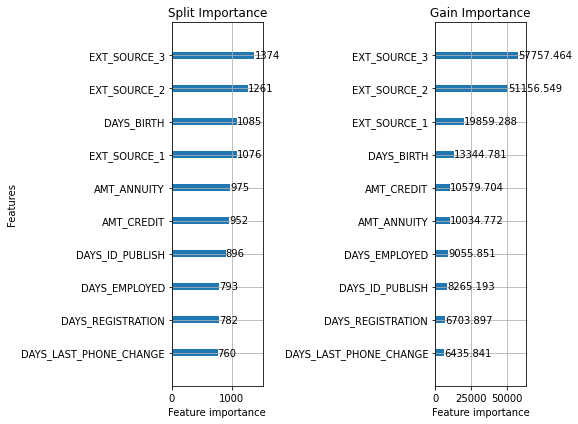

In [25]:
# Top 10

fig = plt.figure(figsize=(8, 6))

ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

# Split Importance
lgb.plot_importance(lgbm_model, max_num_features = 10, importance_type = 'split', ax = ax1, title = 'Split Importance')
# Gain Importane
lgb.plot_importance(lgbm_model, max_num_features = 10, importance_type = 'gain', ax = ax2, ylabel = None, title = 'Gain Importance')
fig.tight_layout()

##### Permutation Importance

In [86]:
# Plot distribution of permutation importance 
lgbm_model.estimators_

AttributeError: 'LGBMClassifier' object has no attribute 'estimators_'

In [53]:
# Top 10 Permutation Importance --- Taking too long, rerun later
perm = PermutationImportance(lgbm_model).fit(X_train_o.iloc[:10000,], y_train_o[:10000])
tmp = eli5.show_weights(perm)
display(eli5.show_weights(perm, top = len(list(X_train_o.columns)), feature_names = list(y_train_o.columns)))

KeyboardInterrupt: 

##### Joint Feature Importance

#### Partial Dependence

##### PDPs

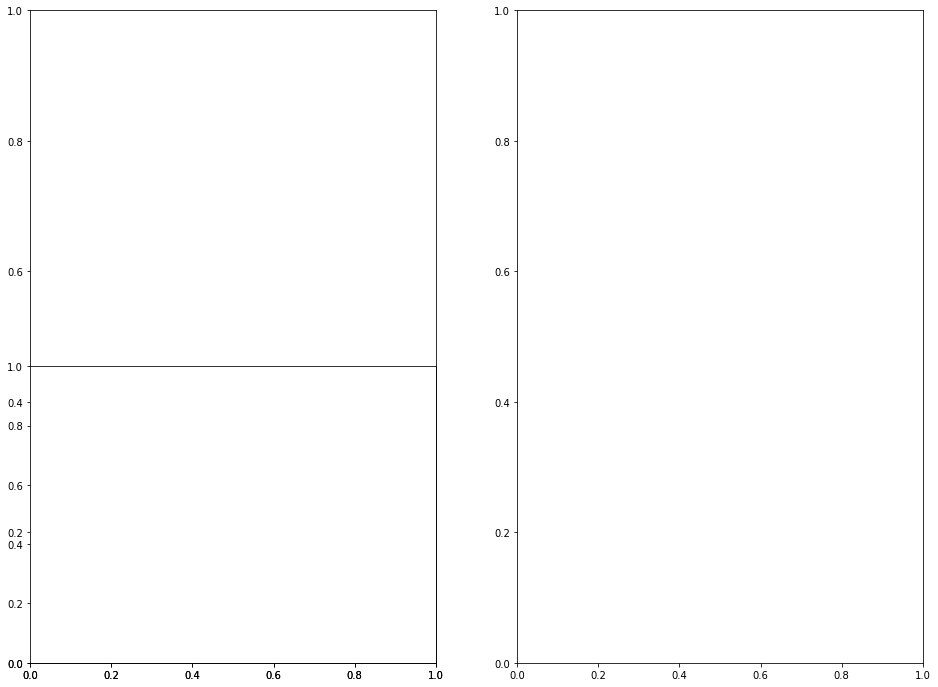

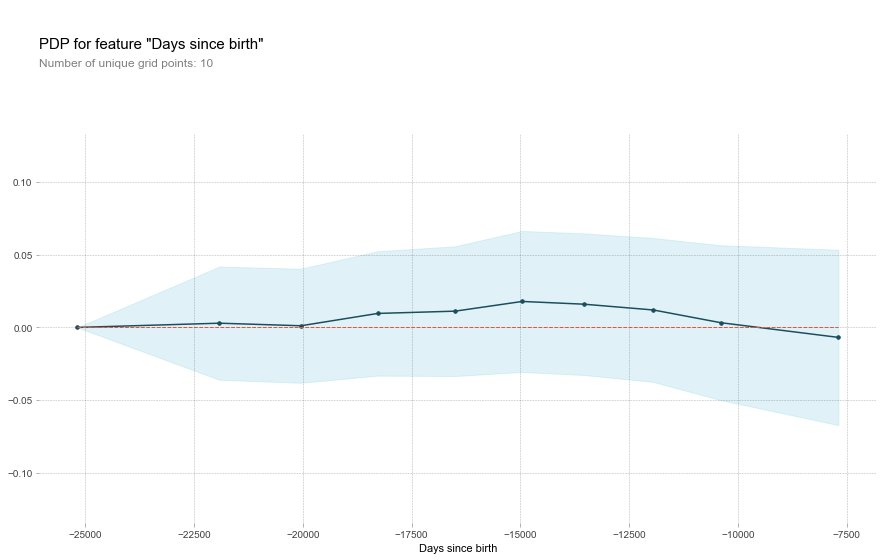

In [28]:
fig = plt.figure(figsize=(16, 12))

ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax3 = fig.add_subplot(223)

pdp_birth = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='DAYS_BIRTH')
pdp.pdp_plot(pdp_birth, 'Days since birth')
plt.show()

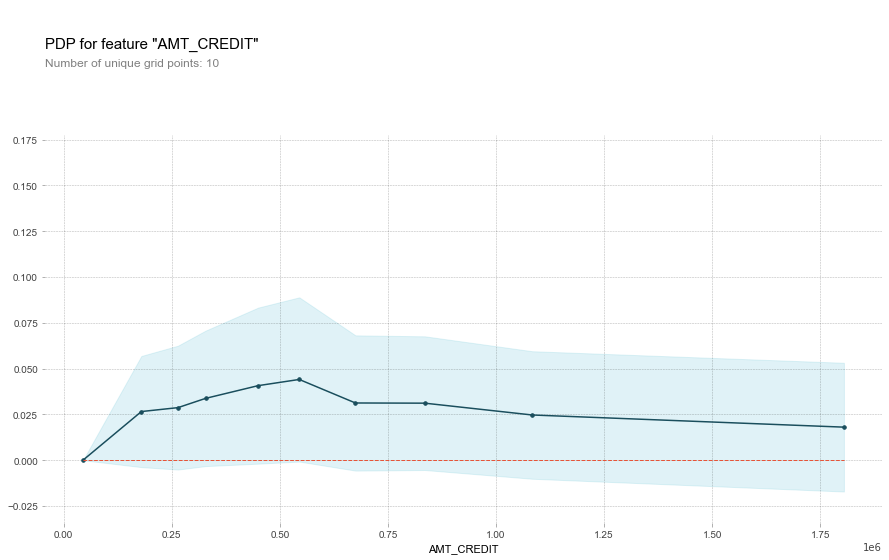

In [32]:
pdp_amount = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='AMT_CREDIT')
pdp.pdp_plot(pdp_amount, 'AMT_CREDIT')
plt.show()

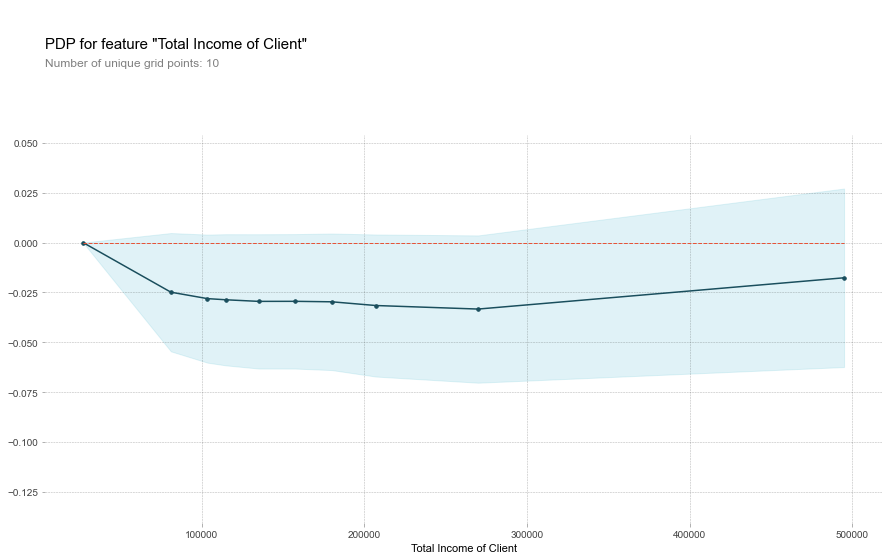

In [29]:
pdp_income = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='AMT_INCOME_TOTAL')
pdp.pdp_plot(pdp_income, 'Total Income of Client')
plt.show()

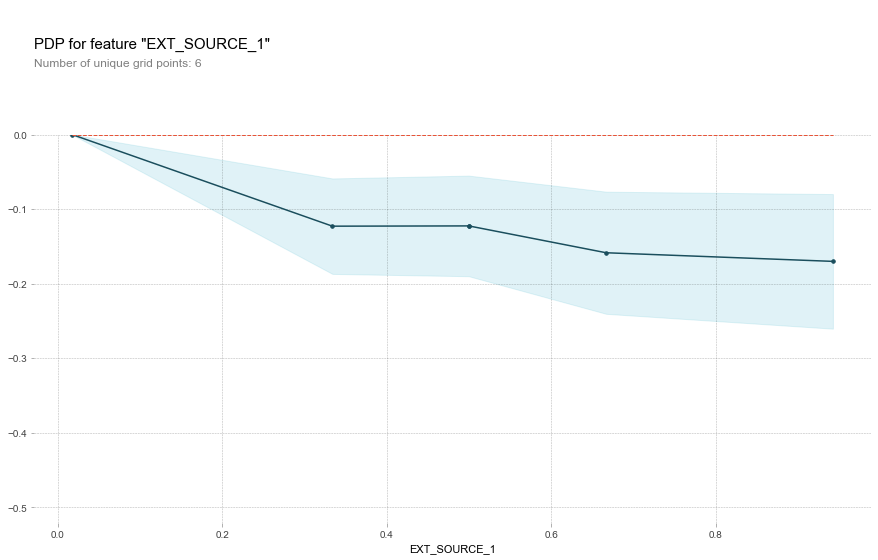

In [34]:
pdp_source1 = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='EXT_SOURCE_1')
pdp.pdp_plot(pdp_source1, 'EXT_SOURCE_1')
plt.show()

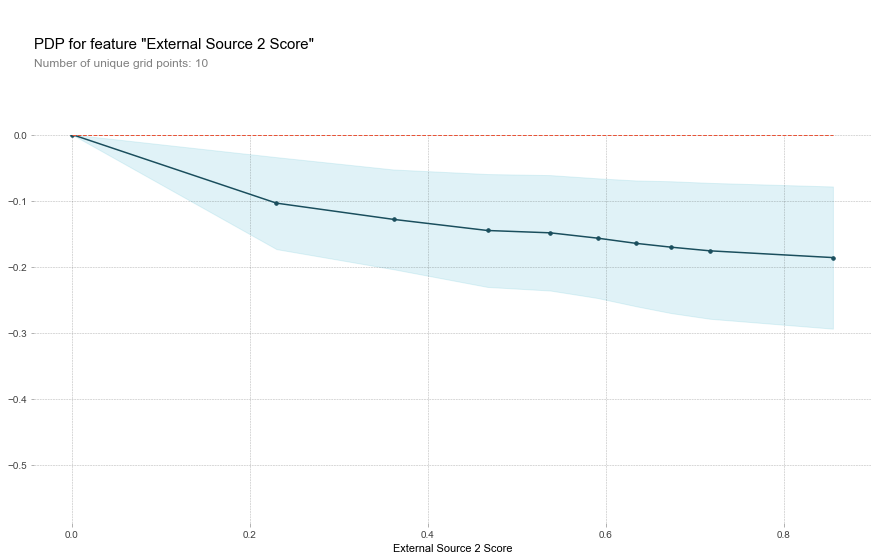

In [77]:
pdp_source2 = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='EXT_SOURCE_2')
pdp.pdp_plot(pdp_source2, 'External Source 2 Score')
plt.show()

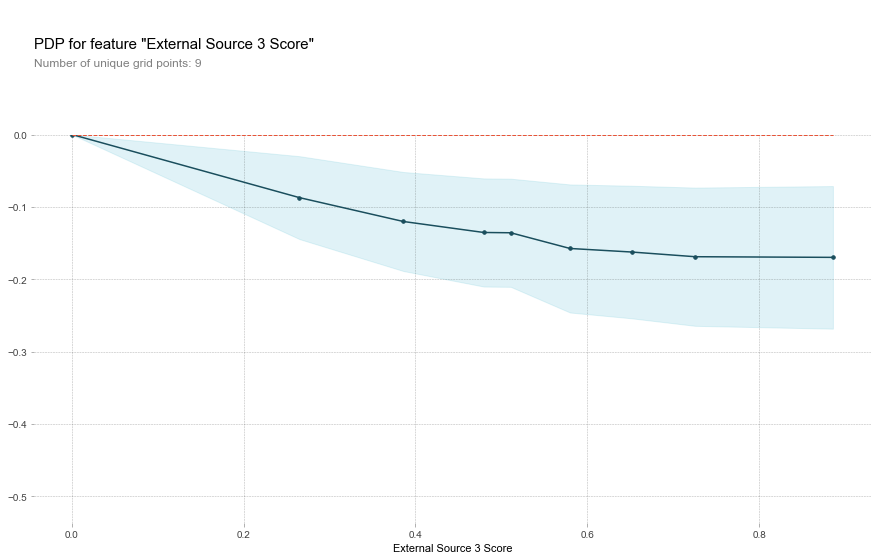

In [79]:
pdp_source3 = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='EXT_SOURCE_3')
pdp.pdp_plot(pdp_source3, 'External Source 3 Score')
plt.show()

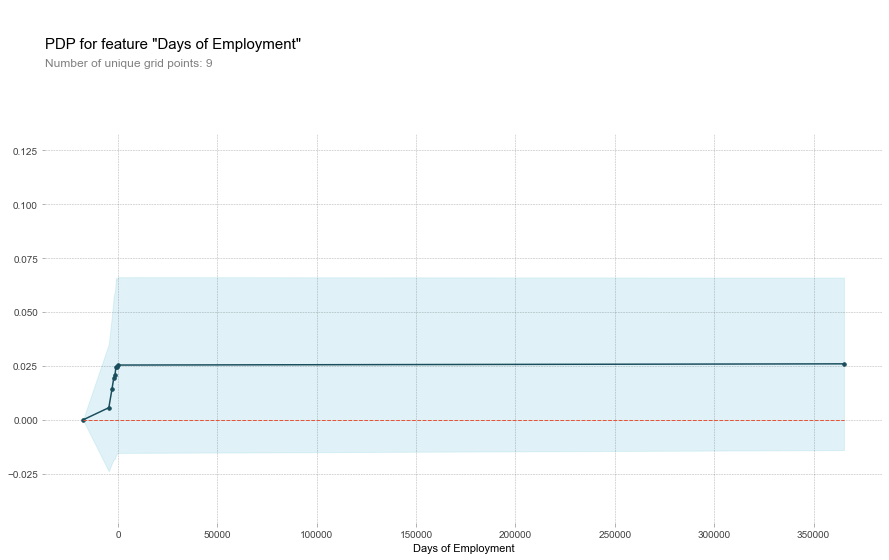

In [74]:
pdp_employ = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='DAYS_EMPLOYED')
pdp.pdp_plot(pdp_employ, 'Days of Employment')
plt.show()

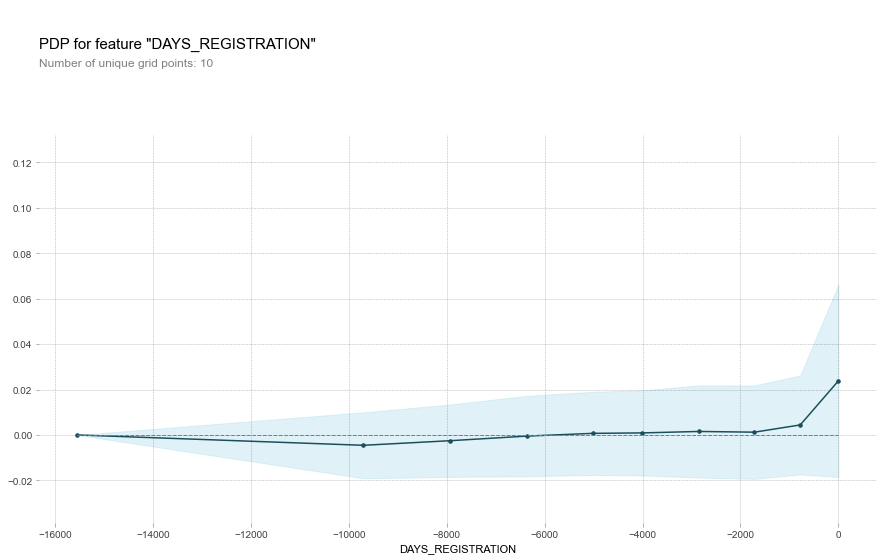

In [33]:
pdp_reg = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='DAYS_REGISTRATION')
pdp.pdp_plot(pdp_reg, 'DAYS_REGISTRATION')
plt.show()

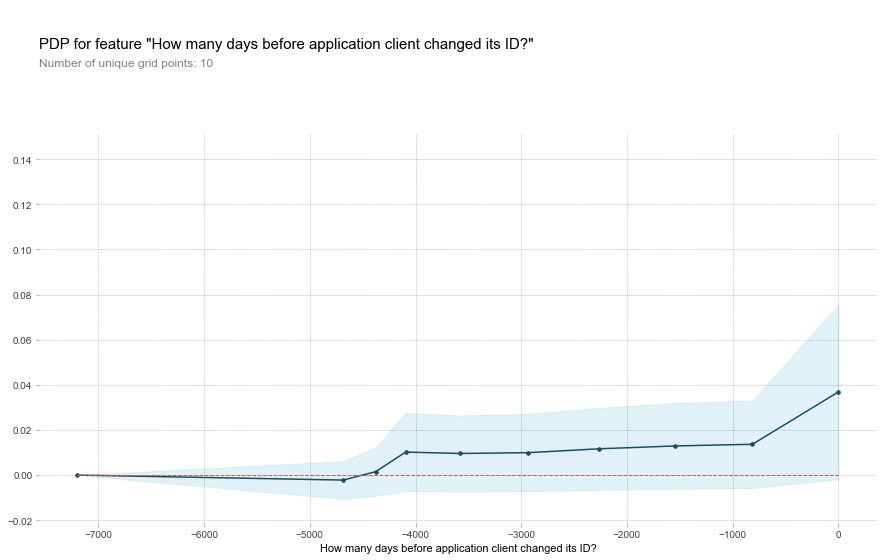

In [80]:
pdp_id = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='DAYS_ID_PUBLISH')
pdp.pdp_plot(pdp_id, 'How many days before application client changed its ID?')
plt.show()

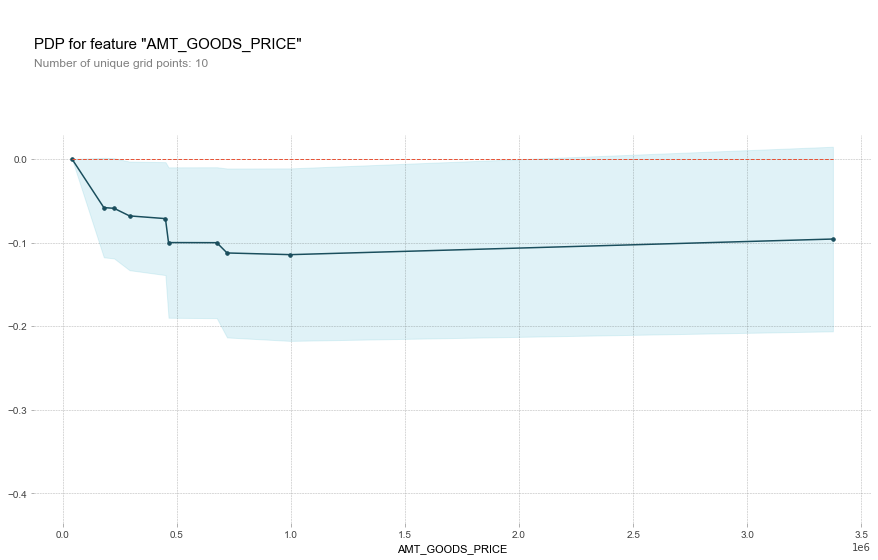

In [81]:
pdp_goods = pdp.pdp_isolate(model=lgbm_model, dataset=X_valid_o, model_features=X_valid_o.columns, feature='AMT_GOODS_PRICE')
pdp.pdp_plot(pdp_goods, 'AMT_GOODS_PRICE')
plt.show()

##### 2D PDPs

KeyboardInterrupt: 

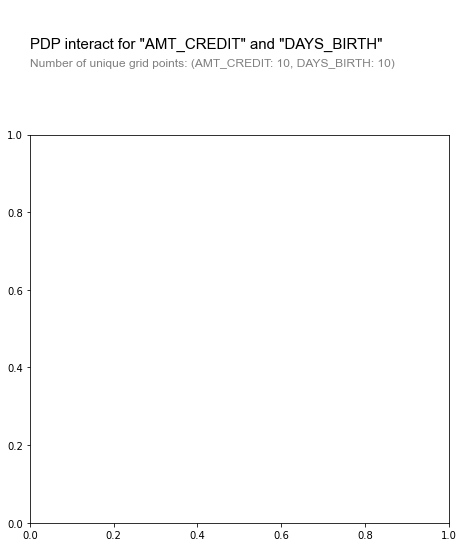

In [114]:
features_to_plot = ['AMT_CREDIT', 'DAYS_BIRTH']
#feature_names = [ 'AMT_CREDIT' ,'DAYS_ID_PUBLISH' ,'AMT_GOODS_PRICE', 'DAYS_BIRTH']
inter1  =  pdp.pdp_interact(model=lgbm_model, dataset= X_train_o.iloc[:10000,], model_features= X_train_o.columns, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='contour')
plt.show()

##### ICE

In [ ]:
# Understand why its not working

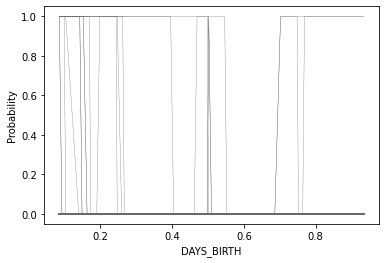

In [106]:
forty_ice_df = ice(data=X_train_o.iloc[:500,:], column='EXT_SOURCE_1', 
                   predict=lgbm_model.predict)
ice_plot(forty_ice_df, c='dimgray', linewidth=0.3)
plt.ylabel('Probability')
plt.xlabel('EXT_SOURCE_1');

##### ALE

In [83]:
proba_fun = lgbm_model.predict_proba
proba_ale = ALE(proba_fun, feature_names=X_train_o.columns)
proba_exp_lr = proba_ale.explain(X_train_o)

NameError: name 'ALE' is not defined

#### SHAP Explanations

In [35]:
lgbm_model

LGBMClassifier(learning_rate=0.03, max_depth=6, n_estimators=700,
               objective='binary')

In [36]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(lgbm_model)

# Calculate Shap values
shap_values = explainer.shap_values(X_train_o[:1000])

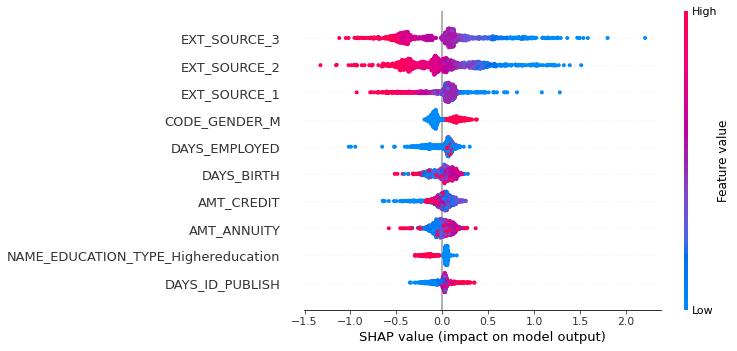

In [37]:
#Summary Plot
shap.summary_plot(shap_values[1], X_train_o[:1000], max_display = 10)

In [56]:
# Waterfall plot - Transform this into probability (https://medium.com/dataman-in-ai/the-shap-with-more-elegant-charts-bc3e73fa1c0c)
expected_value = explainer.expected_value
shap.plots._waterfall.waterfall_legacy(expected_value[1], shap_values[1][1], features=X_train_o.iloc[10, :], feature_names=X_train_o.columns, max_display=15, show=True, link = 'logit')

TypeError: waterfall_legacy() got an unexpected keyword argument 'link'

In [61]:
# Force Plot - What is this plot showing?
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_train_o.columns)

#### LIME

In [38]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train_o),
                    feature_names=X_train_o.columns,  
                    # categorical_features=, 
                    # There is no categorical features in this example, otherwise specify them.                               
                    verbose=True, 
                    mode='classification')

Intercept -0.046581000176288134
Prediction_local [0.1302549]
Right: 0.08647521067565488


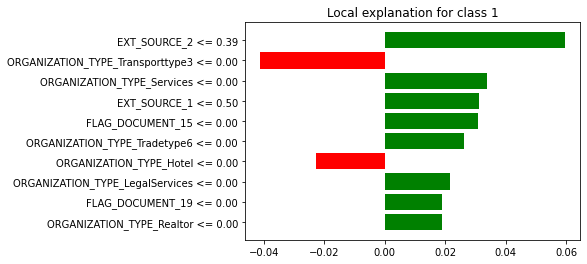

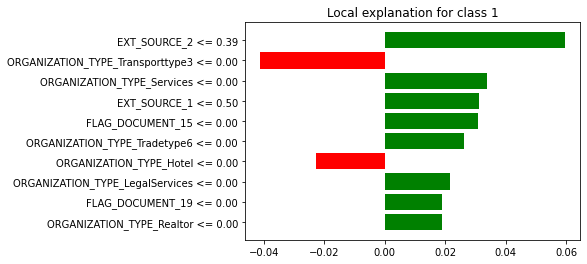

In [39]:
exp = explainer.explain_instance(X_test_o.iloc[0], 
     lgbm_model.predict_proba, num_features=10)
exp.as_pyplot_figure()

In [69]:
exp.show_in_notebook(show_table=True, show_all=False)

In [70]:
exp = explainer.explain_instance(X_test_o.iloc[1], 
     lgbm_model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True, show_all=False)

Intercept 0.16849939949724319
Prediction_local [0.02487954]
Right: 0.006216316604239776


Exception: Data must be 1-dimensional